# HOMEWORK 9

This work presents a comparative analysis of three face detection models: dlib HOG, dlib CNN, and OpenCV DNN. The study evaluates their detection accuracy and robustness across images of varying complexity, including challenging real-world conditions such as multiple faces, small-scale faces, pose variations, and partial occlusions. Additionally, the influence of hyperparameter settings on detection performance is examined.

The experiments were conducted using the WIDER FACE dataset, which provides manually annotated bounding boxes for face detection. The availability of ground-truth annotations allowed quantitative evaluation of detection performance using precision, recall, and F1-score. This ensured an objective comparison of different detectors under diverse real-world conditions.

In [143]:
import os
import cv2
import dlib
import bz2
import urllib.request
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

In [144]:
IMAGES_ROOT = "data/images"
ANNOTATION_TXT = "data/wider_face_train_bbx_gt.txt"

### Model download

In [146]:
def download_file(url, filename):
    if not os.path.exists(filename):
        print(f"Downloading {filename}...")
        urllib.request.urlretrieve(url, filename)
        print("Done.")


def ensure_landmark_model():
    compressed = "shape_predictor_68_face_landmarks.dat.bz2"
    model = "shape_predictor_68_face_landmarks.dat"

    if not os.path.exists(model):
        download_file(
            "http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2",
            compressed
        )
        with bz2.open(compressed, "rb") as f_in:
            with open(model, "wb") as f_out:
                f_out.write(f_in.read())
    return model


def ensure_cnn_model():
    compressed = "mmod_human_face_detector.dat.bz2"
    model = "mmod_human_face_detector.dat"

    if not os.path.exists(model):
        download_file(
            "http://dlib.net/files/mmod_human_face_detector.dat.bz2",
            compressed
        )
        with bz2.open(compressed, "rb") as f_in:
            with open(model, "wb") as f_out:
                f_out.write(f_in.read())
    return model


def ensure_opencv_dnn_model():
    proto = "deploy.prototxt"
    model = "res10_300x300_ssd_iter_140000.caffemodel"

    download_file(
        "https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt",
        proto
    )

    download_file(
        "https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel",
        model
    )

    return proto, model

### Draw function

In [200]:
landmark_model_path = ensure_landmark_model()
predictor = dlib.shape_predictor(landmark_model_path)

def draw_gt_boxes(image, gt_boxes):
    """
    Draws ground-truth bounding boxes (green).
    gt_boxes format: [(x1,y1,x2,y2), ...]
    """
    out = image.copy()
    for (x1, y1, x2, y2) in gt_boxes:
        cv2.rectangle(out, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return out

def draw_detection_and_landmarks(image, boxes):

    img_det = image.copy()
    img_land = image.copy()
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    bright_colors = [
        (0, 255, 255),
        (255, 0, 255),
        (255, 255, 0),
        (0, 255, 0),
        (0, 0, 255),
        (255, 0, 0),
        (0, 128, 255),
        (255, 0, 128)
    ]

    for i, (x1, y1, x2, y2) in enumerate(boxes):

        color = bright_colors[i % len(bright_colors)]

        cv2.rectangle(img_det, (x1, y1), (x2, y2), color, 2)
        cv2.rectangle(img_land, (x1, y1), (x2, y2), color, 2)

        rect = dlib.rectangle(x1, y1, x2, y2)
        shape = predictor(rgb, rect)

        for j in range(68):
            x = shape.part(j).x
            y = shape.part(j).y
            cv2.circle(img_land, (x, y), 2, color, -1)

    return img_det, img_land


### Detector 1 — DLIB HOG

In [ ]:
def detect_hog(image_path, upsample_times=1):
    """
    Dlib HOG face detector.
    upsample_times controls detection of small faces.
    """

    img = cv2.imread(image_path)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    detector = dlib.get_frontal_face_detector()

    faces = detector(rgb, upsample_times)

    boxes = [(f.left(), f.top(), f.right(), f.bottom()) for f in faces]

    det, land = draw_detection_and_landmarks(img, boxes)

    return det, land

def show_hog_result(image_rel_path, upsample_times=1):

    image_path = os.path.join(IMAGES_ROOT, image_rel_path)

    det, land = detect_hog(image_path, upsample_times=upsample_times)

    plt.figure(figsize=(15,10))

    plt.subplot(1,2,1)
    plt.title(f"HOG Detection (upsample={upsample_times})")
    plt.imshow(cv2.cvtColor(det, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("HOG Landmarks")
    plt.imshow(cv2.cvtColor(land, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

### Detector 2 — DLIB CNN

In [161]:
cnn_model_path = ensure_cnn_model()
cnn_detector = dlib.cnn_face_detection_model_v1(cnn_model_path)


def detect_cnn(image_path, upsample_times=0, use_clahe=False):
    """
    Dlib CNN face detector.
    upsample_times: helps detect small faces.
    use_clahe: improves contrast for grayscale images.
    """

    img = cv2.imread(image_path)

    if use_clahe:
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        gray = clahe.apply(gray)

        # Convert back to RGB
        rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    else:
        rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = cnn_detector(rgb, upsample_times)

    boxes = [(f.rect.left(), f.rect.top(),
              f.rect.right(), f.rect.bottom()) for f in faces]

    det, land = draw_detection_and_landmarks(img, boxes)

    return det, land

def show_cnn_result(image_rel_path, upsample_times=0, use_clahe=False):

    image_path = os.path.join(IMAGES_ROOT, image_rel_path)

    det, land = detect_cnn(
        image_path,
        upsample_times=upsample_times,
        use_clahe=use_clahe
    )

    plt.figure(figsize=(15,10))

    plt.subplot(1,2,1)
    plt.title(f"CNN Detection (upsample={upsample_times}, CLAHE={use_clahe})")
    plt.imshow(cv2.cvtColor(det, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("CNN Landmarks")
    plt.imshow(cv2.cvtColor(land, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

### Detector 3 — OPENCV DNN

In [164]:
proto, model = ensure_opencv_dnn_model()
net = cv2.dnn.readNetFromCaffe(proto, model)


def detect_opencv_dnn(image_path, conf_threshold=0.5):
    """
    OpenCV DNN face detector with configurable confidence threshold.
    """

    img = cv2.imread(image_path)
    h, w = img.shape[:2]

    blob = cv2.dnn.blobFromImage(img, 1.0, (300, 300),
                                 (104, 177, 123))
    net.setInput(blob)
    detections = net.forward()

    boxes = []

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]

        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * w)
            y1 = int(detections[0, 0, i, 4] * h)
            x2 = int(detections[0, 0, i, 5] * w)
            y2 = int(detections[0, 0, i, 6] * h)

            boxes.append((x1, y1, x2, y2))

    det, land = draw_detection_and_landmarks(img, boxes)
    return det, land

def show_dnn_result(image_rel_path, dnn_threshold=0.5):
    """
    Runs only OpenCV DNN detector
    and displays detection + landmarks.
    """

    image_path = os.path.join(IMAGES_ROOT, image_rel_path)

    dnn_det, dnn_land = detect_opencv_dnn(
        image_path,
        conf_threshold=dnn_threshold
    )

    plt.figure(figsize=(15, 10))

    plt.subplot(1, 2, 1)
    plt.title("DNN Detection")
    plt.imshow(cv2.cvtColor(dnn_det, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("DNN Landmarks")
    plt.imshow(cv2.cvtColor(dnn_land, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
# Bounding-box detectors (for metrics)

def detect_hog_boxes(image_path):
    """
    Runs dlib HOG face detector.
    Returns only bounding boxes.
    """
    img = cv2.imread(image_path)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = dlib.get_frontal_face_detector()(rgb, 1)

    return [(f.left(), f.top(), f.right(), f.bottom()) for f in faces]


def detect_cnn_boxes(image_path):
    """
    Runs dlib CNN face detector.
    Returns only bounding boxes.
    """
    img = cv2.imread(image_path)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = cnn_detector(rgb, 0)

    return [(f.rect.left(), f.rect.top(),
             f.rect.right(), f.rect.bottom()) for f in faces]


def detect_opencv_dnn_boxes(image_path, conf_threshold=0.5):
    """
    Runs OpenCV DNN face detector.
    Returns only bounding boxes.
    """
    img = cv2.imread(image_path)
    h, w = img.shape[:2]

    blob = cv2.dnn.blobFromImage(img, 1.0, (300, 300),
                                 (104, 177, 123))
    net.setInput(blob)
    detections = net.forward()

    boxes = []

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]

        if confidence > conf_threshold:
            x1 = int(detections[0, 0, i, 3] * w)
            y1 = int(detections[0, 0, i, 4] * h)
            x2 = int(detections[0, 0, i, 5] * w)
            y2 = int(detections[0, 0, i, 6] * h)

            boxes.append((x1, y1, x2, y2))

    return boxes

### Metrics function

In [ ]:
def parse_annotations(txt_path):
    """
    Robust WIDER FACE parser.
    Automatically detects image lines and safely parses face counts.
    """

    data = {}

    with open(txt_path, "r") as f:
        lines = [l.strip() for l in f if l.strip() != ""]

    i = 0
    total = len(lines)

    while i < total:

        line = lines[i]

        # Detect image path
        if "/" in line and line.endswith(".jpg"):

            img_path = line
            i += 1

            # If next line is not a number, skip safely
            if i >= total or not lines[i].isdigit():
                continue

            num_faces = int(lines[i])
            i += 1

            boxes = []

            for _ in range(num_faces):
                if i >= total:
                    break

                parts = lines[i].split()

                if not parts[0].isdigit():
                    break

                x, y, w, h = map(int, parts[:4])
                boxes.append((x, y, x + w, y + h))
                i += 1

            data[img_path] = boxes

        else:
            i += 1

    return data

def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    inter = max(0, xB - xA) * max(0, yB - yA)
    areaA = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    areaB = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    return inter / (areaA + areaB - inter + 1e-6)

def evaluate_metrics(annotation_txt, images_root, detector_function):

    annotations = parse_annotations(annotation_txt)

    TP = FP = FN = 0

    for img_rel, gt_boxes in annotations.items():

        image_path = os.path.join(images_root, img_rel)

        if not os.path.exists(image_path):
            continue

        pred_boxes = detector_function(image_path)

        matched = [False] * len(gt_boxes)

        for pb in pred_boxes:
            found = False
            for i, gb in enumerate(gt_boxes):
                if not matched[i] and iou(pb, gb) > 0.5:
                    TP += 1
                    matched[i] = True
                    found = True
                    break
            if not found:
                FP += 1

        FN += matched.count(False)

    precision = TP / (TP + FP + 1e-6)
    recall = TP / (TP + FN + 1e-6)
    f1 = 2 * precision * recall / (precision + recall + 1e-6)

    return precision, recall, f1

### Compare models

In [ ]:
def compare_models(image_rel_path, dnn_threshold=0.5):
    """
    Displays:
        [ Ground Truth ]  [ HOG ]
        [ CNN ]           [ OpenCV DNN ]

    Also computes TP / FP / FN for each detector
    and returns results as a dictionary.
    """

    annotations = parse_annotations(ANNOTATION_TXT)

    image_path = os.path.join(IMAGES_ROOT, image_rel_path)

    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Image not found: {image_path}")

    gt_boxes = annotations.get(image_rel_path, [])

    # Draw Ground Truth
    gt_img = draw_gt_boxes(img, gt_boxes)

    # Detection + landmarks (for visualization)
    hog_det, hog_land = detect_hog(image_path)
    cnn_det, cnn_land = detect_cnn(image_path)
    dnn_det, dnn_land = detect_opencv_dnn(image_path, conf_threshold=dnn_threshold)

    # METRIC CALCULATION

    results = {}

    models_for_metrics = [
        ("HOG", detect_hog_boxes),
        ("CNN", detect_cnn_boxes),
        ("OpenCV DNN", lambda p: detect_opencv_dnn_boxes(p, conf_threshold=dnn_threshold))
    ]

    for name, box_func in models_for_metrics:

        pred_boxes = box_func(image_path)
        matched = [False] * len(gt_boxes)

        TP = 0
        FP = 0

        for pb in pred_boxes:
            found = False
            for i, gb in enumerate(gt_boxes):
                if not matched[i] and iou(pb, gb) > 0.5:
                    TP += 1
                    matched[i] = True
                    found = True
                    break
            if not found:
                FP += 1

        FN = matched.count(False)

        # Derived metrics
        precision = TP / (TP + FP + 1e-6)
        recall = TP / (TP + FN + 1e-6)
        f1 = 2 * precision * recall / (precision + recall + 1e-6)

        results[name] = {
            "TP": TP, "FP": FP, "FN": FN,
            "Precision": precision, "Recall": recall, "F1": f1
        }


    # VISUALIZATION (2x2)
    
    plt.figure(figsize=(12, 10))

    plt.subplot(2, 2, 1)
    plt.title("Ground Truth")
    plt.imshow(cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 2)
    plt.title("HOG")
    plt.imshow(cv2.cvtColor(hog_land, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 3)
    plt.title("CNN")
    plt.imshow(cv2.cvtColor(cnn_land, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 4)
    plt.title("OpenCV DNN")
    plt.imshow(cv2.cvtColor(dnn_land, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return results

#### Experiment 1

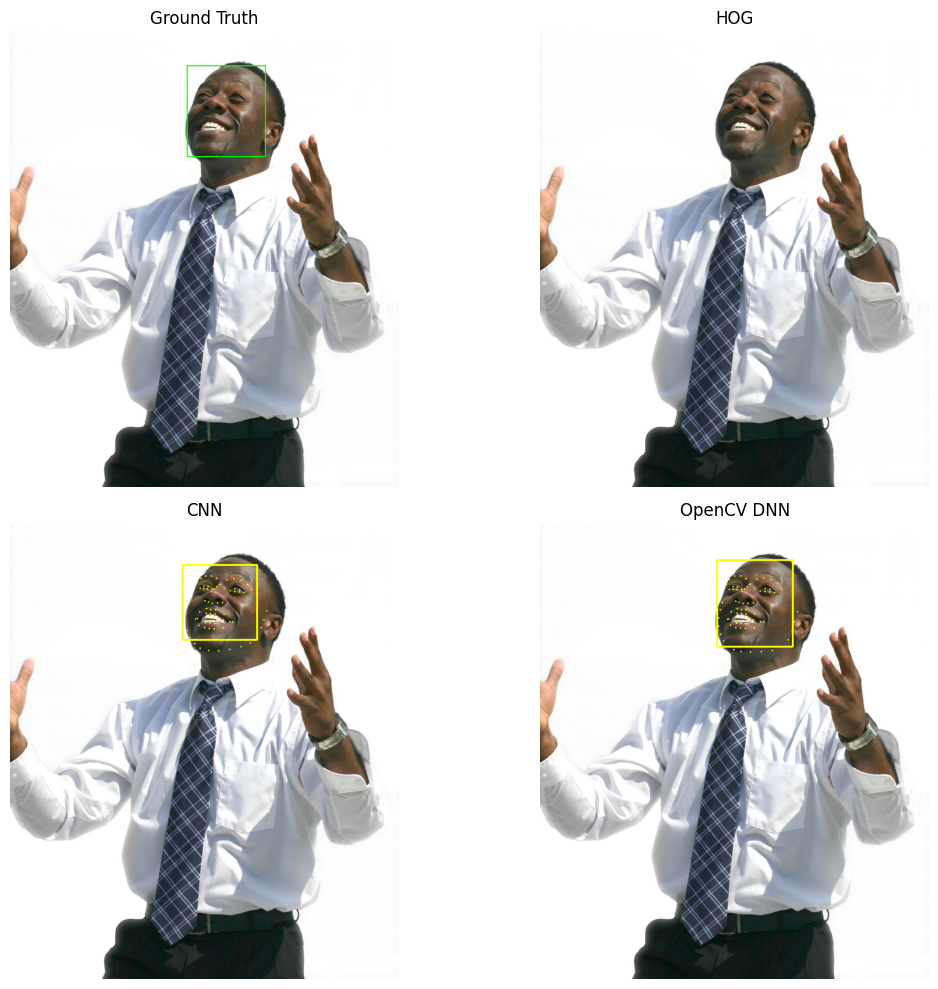

In [199]:
metrics1 = compare_models("7--Cheering/7_Cheering_Cheering_7_126.jpg")

In [157]:
pd.DataFrame(metrics1).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,0.0,0.0,1.0,0.0,0.0,0.0
CNN,1.0,0.0,0.0,1.0,1.0,1.0
OpenCV DNN,1.0,0.0,0.0,1.0,1.0,1.0


The image contains one face with a rotated head position.

The HOG detector did not detect the face. This indicates that the classical feature-based approach is sensitive to head pose variations and performs poorly when the face is not strictly frontal.

The DLIB CNN detector successfully detected the face and localized it accurately. The model handled the rotation well, and landmark estimation was stable.

The OpenCV DNN detector also correctly detected the face and produced an accurate bounding box. Its performance is comparable to the CNN-based dlib detector.

#### Experiment 2

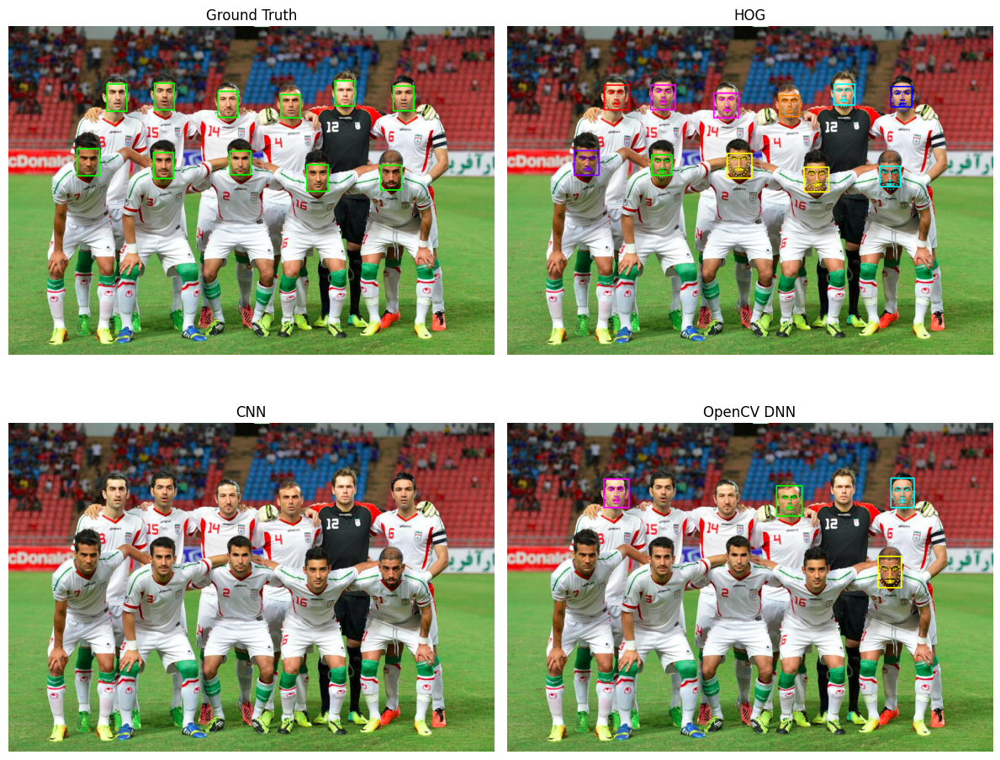

In [196]:
metrics2 = compare_models("7--Cheering/7_Cheering_Cheering_7_779.jpg")

In [159]:
pd.DataFrame(metrics2).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,11.0,0.0,0.0,1.0,1.000,1.000
CNN,0.0,0.0,11.0,0.0,0.000,0.000
OpenCV DNN,4.0,0.0,7.0,1.0,0.364,0.533


The image contains 11 clearly visible frontal faces. 

The image presents several challenging conditions for face detection, including small face sizes in the back row, variation in scale between subjects, slight pose differences, and a visually complex background with significant color contrast and texture.

The HOG detector correctly detected all 11 faces (TP = 11). No false positives were observed. Both precision and recall are equal to 1.0, indicating perfect detection performance for this image.

The CNN detector failed to detect any faces (TP = 0, FN = 11). Precision and recall are both zero. This suggests that the detector did not respond under the current configuration or threshold.

The OpenCV DNN detector detected 4 out of 11 faces. No false positives were observed. Precision is high (1.0), but recall is low (0.36), indicating that the model is conservative and misses multiple faces, especially smaller ones.

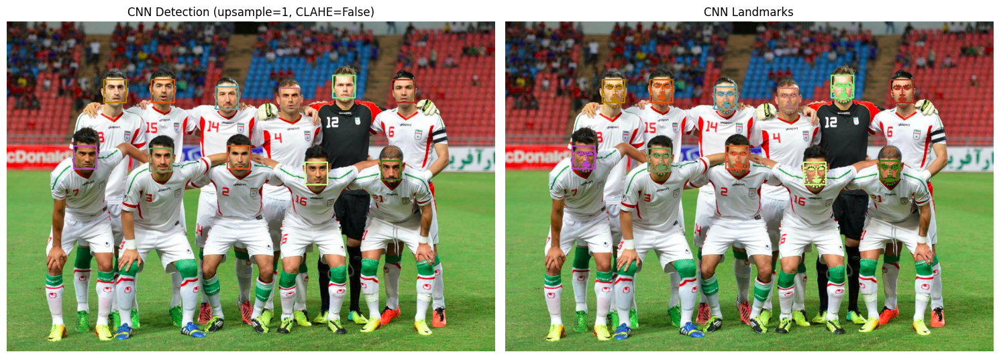

In [162]:
show_cnn_result("7--Cheering/7_Cheering_Cheering_7_779.jpg", upsample_times=1, use_clahe=False)

With upsample=1, the CNN detector successfully detected all visible faces in the group image. The model handled multiple subjects, similar face scales, and frontal poses effectively.

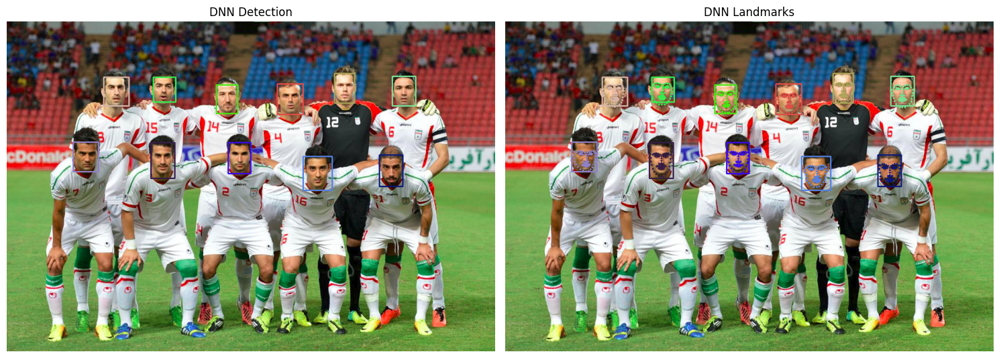

In [165]:
show_dnn_result(
    "7--Cheering/7_Cheering_Cheering_7_779.jpg",
    dnn_threshold=0.2
)

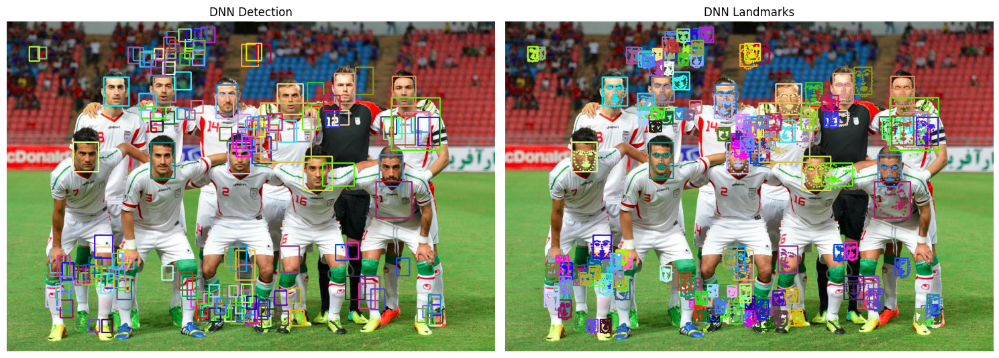

In [166]:
show_dnn_result(
    "7--Cheering/7_Cheering_Cheering_7_779.jpg",
    dnn_threshold=0.1
)

At a confidence threshold of 0.2, the DNN detector successfully identified all faces in the image. However, further decreasing the threshold to 0.1 resulted in excessive false detections, significantly reducing precision.

#### Experiment 3

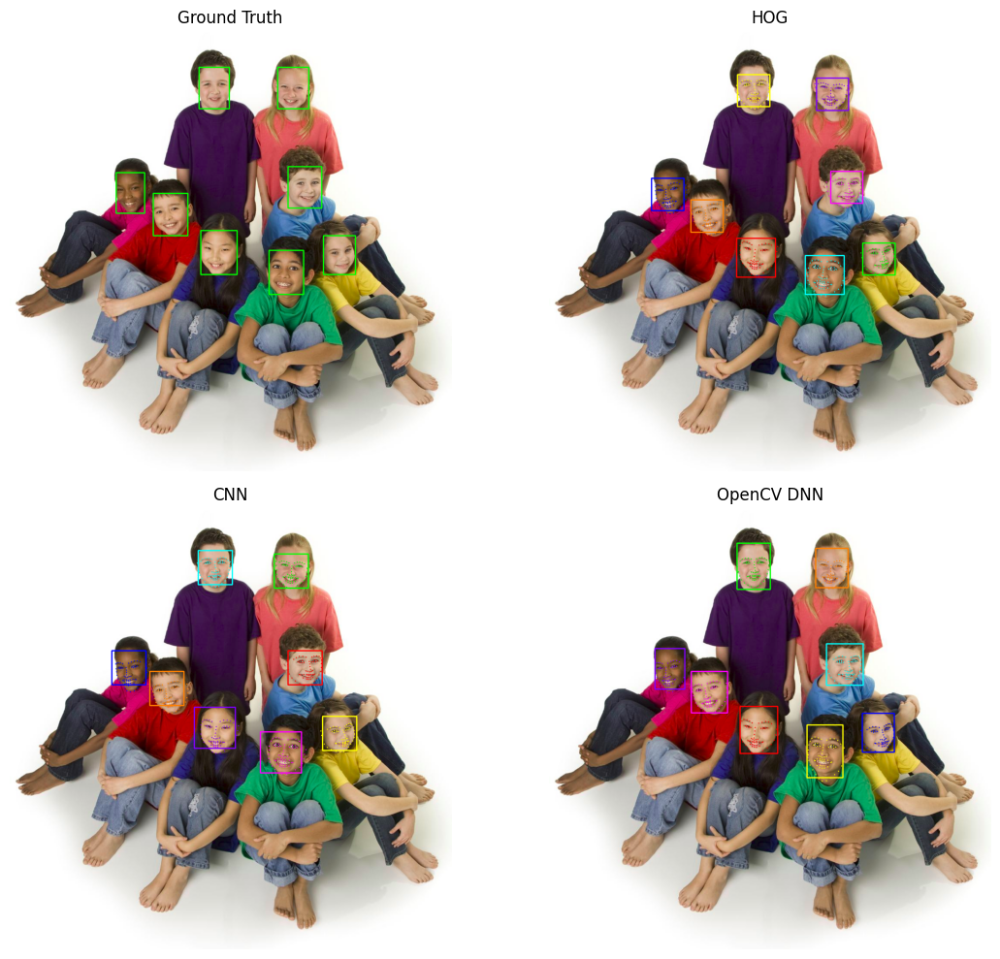

In [195]:
metrics3 = compare_models("12--Group/12_Group_Group_12_Group_Group_12_37.jpg")

In [85]:
pd.DataFrame(metrics3).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,8.0,0.0,0.0,1.0,1.0,1.0
CNN,8.0,0.0,0.0,1.0,1.0,1.0
OpenCV DNN,8.0,0.0,0.0,1.0,1.0,1.0


This image contains 8 clearly visible, frontal faces with good lighting and minimal occlusion.

All three detectors (HOG, CNN, OpenCV DNN) successfully detected all faces (TP = 8, FP = 0, FN = 0). Precision, Recall, and F1-score are equal to 1.0 for all models.

The difference compared to the football team image is mainly due to image characteristics:

- Faces are larger in scale.
- Faces are fully frontal.
- Lighting is uniform.
- There is minimal background complexity.
- There is little or no overlap between faces.

This image represents an “easy” detection scenario, where classical (HOG) and deep learning-based detectors perform equally well.

#### Experiment 4

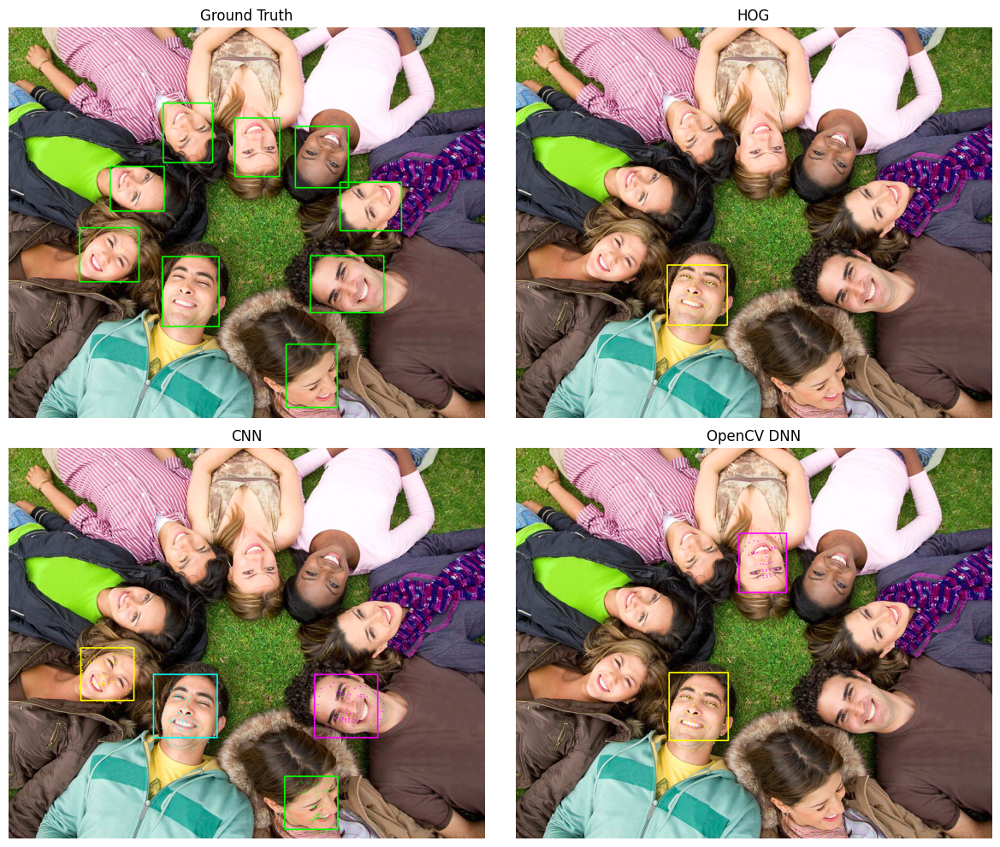

In [194]:
metrics4 = compare_models("12--Group/12_Group_Group_12_Group_Group_12_124.jpg")

In [169]:
pd.DataFrame(metrics4).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,1.0,0.0,8.0,1.0,0.111,0.200
CNN,4.0,0.0,5.0,1.0,0.444,0.615
OpenCV DNN,2.0,0.0,7.0,1.0,0.222,0.364


The image contains 9 faces arranged in a circular layout. All faces are rotated relative to the standard upright orientation.

The HOG detector detected only 1 out of 9 faces (Recall = 0.11). It failed on most faces due to strong rotation and non-frontal alignment. Precision remains 1.0 because no false positives were produced.

The CNN detector detected 4 out of 9 faces (Recall = 0.44). It performs better than HOG under rotation but still misses several faces. Precision is 1.0, indicating no incorrect detections.

The OpenCV DNN detector detected 2 out of 9 faces (Recall = 0.22). Performance is limited under extreme head rotation. Precision remains high due to the absence of false positives.

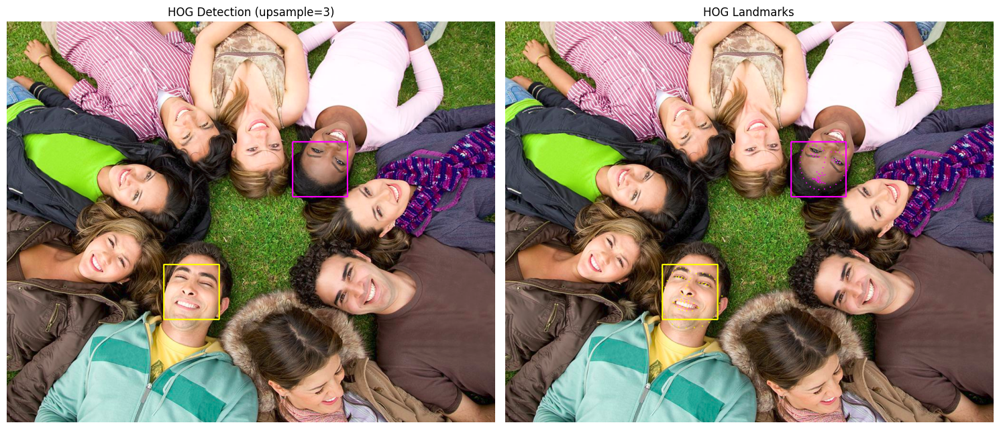

In [193]:
show_hog_result("12--Group/12_Group_Group_12_Group_Group_12_124.jpg", upsample_times=3)

Increasing the upsample parameter from 1 to 3 for HOG improved the detection of small and rotated faces. One additional face was successfully detected at higher resolution.

#### Experiment 5

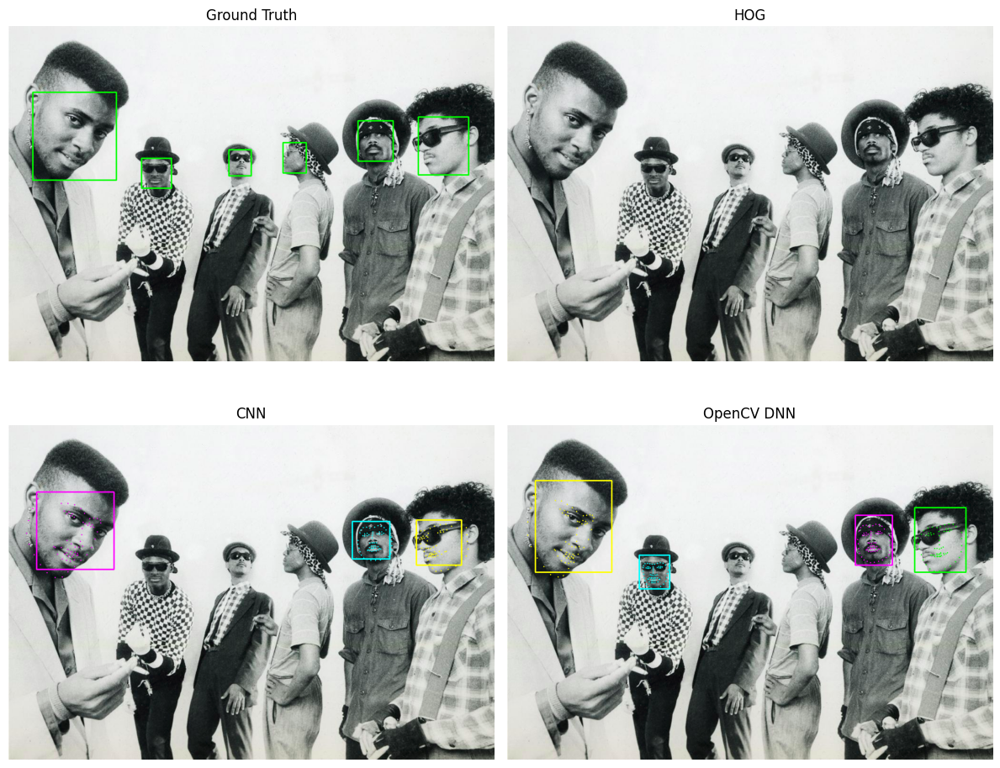

In [192]:
metrics5 = compare_models("12--Group/12_Group_Group_12_Group_Group_12_324.jpg")

In [90]:
pd.DataFrame(metrics5).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,0.0,0.0,6.0,0.0,0.000,0.000
CNN,3.0,0.0,3.0,1.0,0.500,0.667
OpenCV DNN,4.0,0.0,2.0,1.0,0.667,0.800


The image contains 6 faces with varying poses, partial occlusions, sunglasses, and headwear.

The HOG detector failed completely (TP = 0, FN = 6). It did not detect any faces. Performance is strongly affected by occlusions, non-frontal poses, and accessories such as hats and sunglasses.

The CNN detector detected 3 out of 6 faces (Recall = 0.50). No false positives were produced (Precision = 1.0). The model handles occlusion better than HOG but still misses partially covered or non-frontal faces.

The OpenCV DNN detector detected 4 out of 6 faces (Recall = 0.67). Precision remains 1.0, with no incorrect detections. This model shows the highest robustness in this scenario, handling accessories and moderate occlusion better than the others.

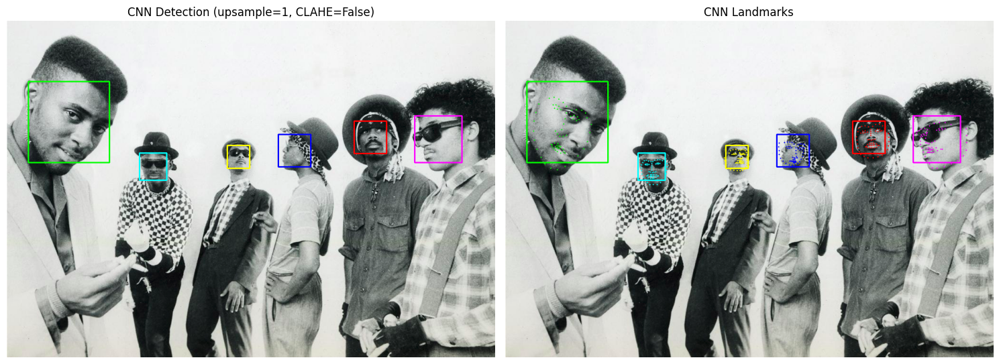

In [191]:
show_cnn_result("12--Group/12_Group_Group_12_Group_Group_12_324.jpg", upsample_times=1, use_clahe=False)

For the CNN detector, increasing the upsampling parameter to 1 resulted in successful detection of all visible faces in the image. The model handled grayscale conditions and moderate pose variations effectively at this setting.

#### Experiment 6

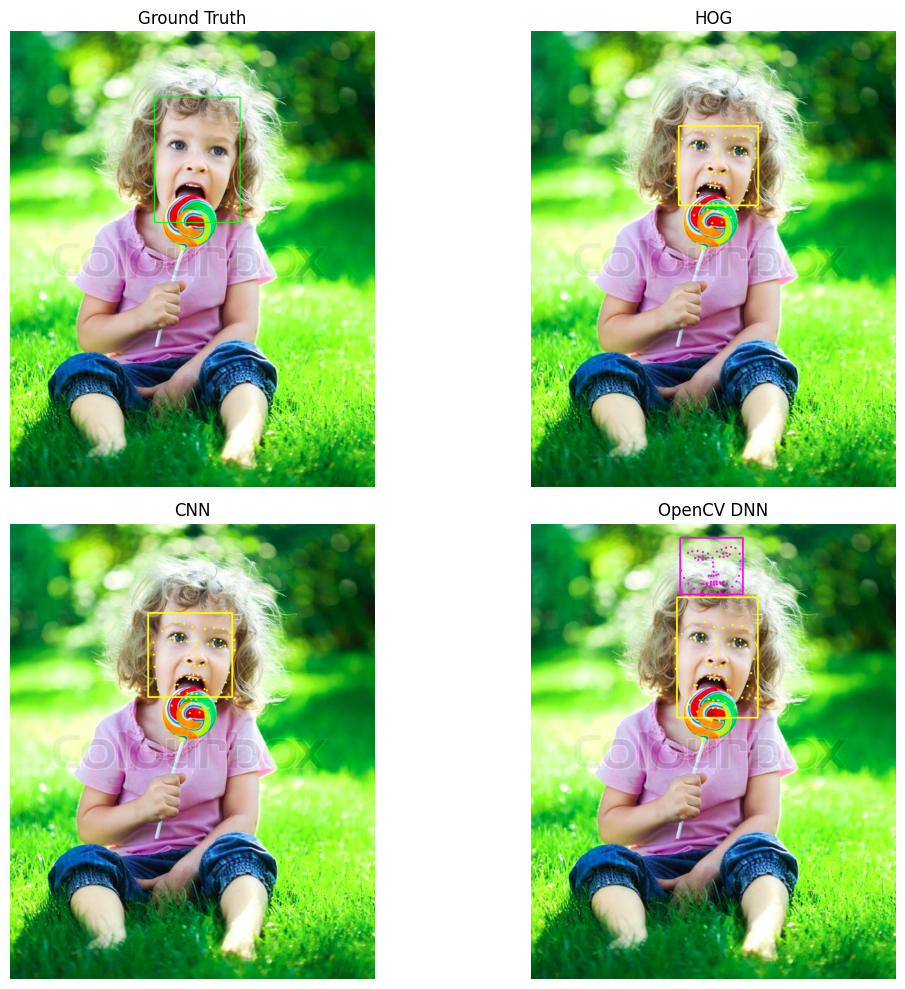

In [181]:
metrics6 = compare_models("22--Picnic/22_Picnic_Picnic_22_940.jpg")

In [93]:
pd.DataFrame(metrics6).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,1.0,0.0,0.0,1.0,1.0,1.000
CNN,1.0,0.0,0.0,1.0,1.0,1.000
OpenCV DNN,1.0,1.0,0.0,0.5,1.0,0.667


Single frontal child's face.
HOG and DLIB CNN detected the face correctly with no false positives (TP=1, FP=0).
OpenCV DNN detected the true face but produced one additional false positive (TP=1, FP=1), likely triggered by high-contrast background/hair patterns.

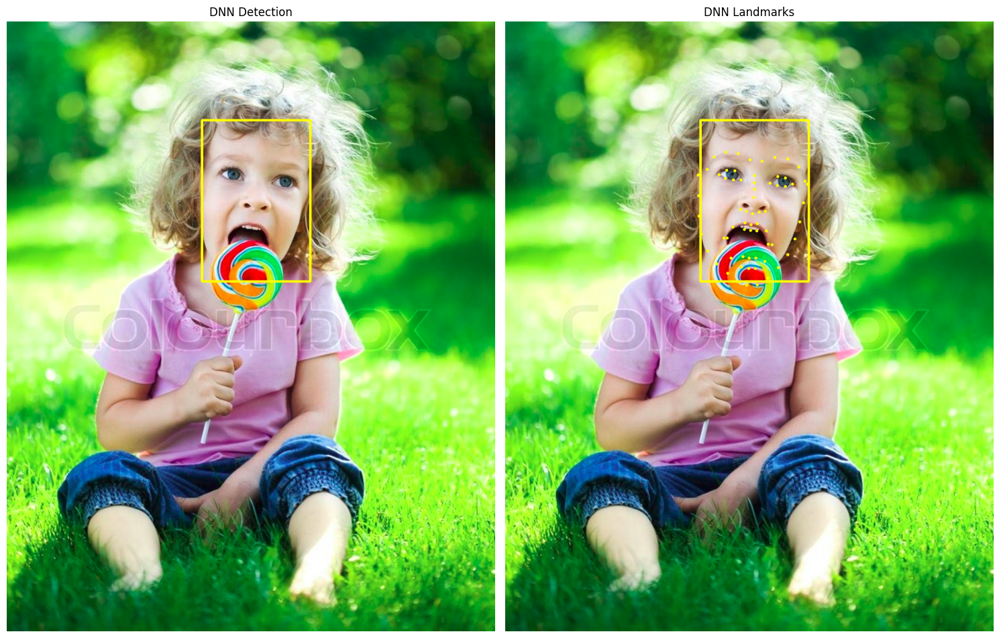

In [182]:
show_dnn_result(
    "22--Picnic/22_Picnic_Picnic_22_940.jpg",
    dnn_threshold=0.8
)

At dnn_threshold = 0.8, the OpenCV DNN detector keeps only high-confidence detections.
In this image, the face is large, frontal, and well-lit, so the correct face detection remains above 0.8, while the previous false positive (weak, low-confidence) is filtered out. A higher threshold leads to fewer false positives, potentially more missed faces; here it removed the FP without losing the true face.

#### Experiment 7

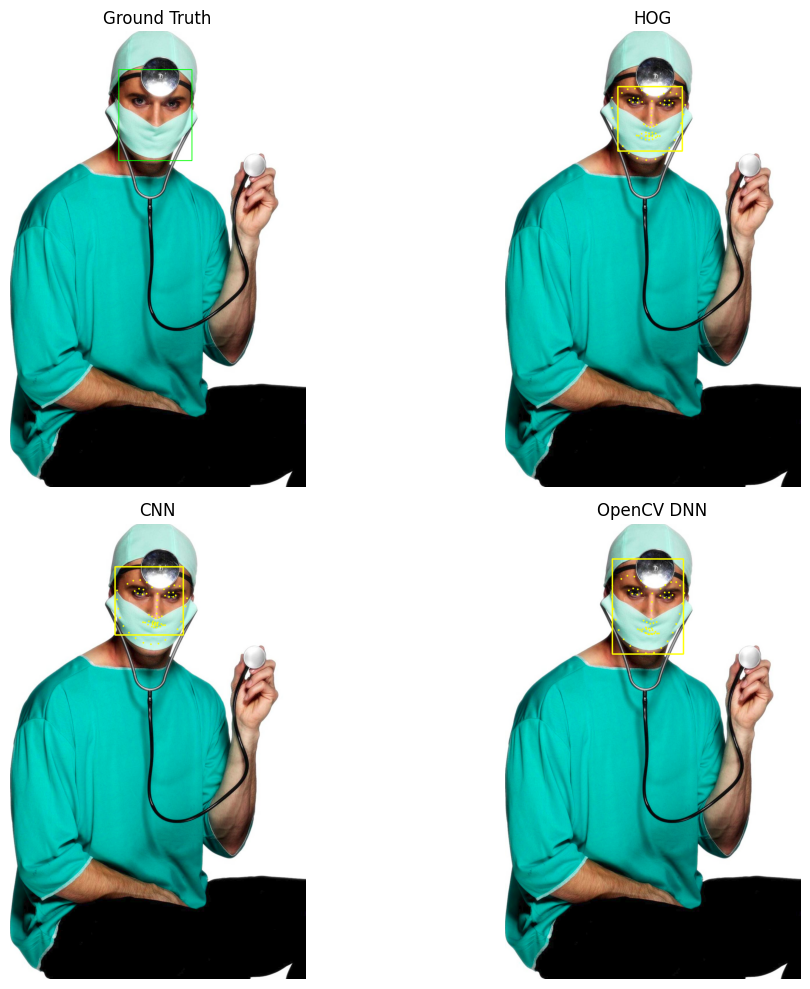

In [184]:
metrics7 = compare_models("30--Surgeons/30_Surgeons_Surgeons_30_267.jpg")

In [141]:
pd.DataFrame(metrics7).T.round(3)

,TP,FP,FN,Precision,Recall,F1
HOG,1.0,0.0,0.0,1.0,1.0,1.0
CNN,1.0,0.0,0.0,1.0,1.0,1.0
OpenCV DNN,1.0,0.0,0.0,1.0,1.0,1.0


All three detectors (HOG, CNN, and OpenCV DNN) successfully detected the face despite partial occlusion caused by the surgical mask and head covering. The face is frontal and relatively large, which supports stable detection. The occlusion of the lower facial region did not prevent detection, indicating robustness of all models to moderate occlusion. 

# Conclusions: Detector Behavior on Challenging Images

The experiments on more complex images (multiple faces, small-scale faces, occlusions such as glasses, hats, and helmets) revealed clear differences in detector behavior and robustness.

The **HOG-based detector** performs reliably on frontal, well-lit faces with minimal pose variation. However, its robustness is limited in challenging scenarios. It struggles with small faces, rotated heads, and crowded scenes. The detector is sensitive to scale, and detection performance improves when increasing the upsampling parameter. Therefore, HOG demonstrates low robustness under complex real-world conditions.

The **CNN-based detector** shows significantly better robustness compared to HOG. It handles moderate pose variation, partial occlusion, and scale differences more effectively. Increasing the upsampling parameter improves detection of smaller faces but increases computational cost. Overall, the CNN model demonstrates moderate to high robustness across challenging scenarios.


The **OpenCV DNN detector** is highly sensitive to the confidence threshold hyperparameter. Lower thresholds increase recall and enable detection of smaller or less confident faces, but significantly reduce precision due to false positives. Higher thresholds improve precision but may miss difficult faces. When properly tuned, the DNN detector provides strong performance in multi-face and small-scale scenarios. Its robustness depends heavily on appropriate threshold selection.

**Importance of Hyperparameter Tuning**

The experiments demonstrate that detector performance is not solely algorithm-dependent but also strongly influenced by hyperparameter configuration.

Key hyperparameters include:

- Upsampling factor (HOG, CNN)

- Confidence threshold (OpenCV DNN)

- IoU threshold (evaluation stage)

Without proper parameter tuning, detector performance may degrade significantly. Optimal hyperparameters should be selected using validation-based metric evaluation (e.g., maximizing F1-score), rather than visual inspection.

Thus, robustness depends not only on model architecture but also on systematic hyperparameter optimization.